In [2]:
#Version 7: [Nidhi] Added Canny Edge Detection as part of Image Enhancement
#version 8: [Nidhi] [Created  CNNmodel]
import pandas as pd
import numpy as np
import os
import sys
import warnings
import random
import matplotlib.pyplot as plt
from skimage.util.montage import montage2d as montage
from skimage.io import imread, concatenate_images, imshow
from skimage.segmentation import mark_boundaries
from skimage.measure import label, regionprops
import cv2 #Nidhi
from skimage import exposure

#VERSION 8 CODE
from keras import models, layers
from keras.models import Model, load_model
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate

import keras.backend as K
from keras.optimizers import Adam
from keras.losses import binary_crossentropy

In [3]:
# Adapted Encoder from user Paulo Pinto for use in the Carvana Image Masking challenge
# Released under the Apache 2.0 open source license
# https://www.kaggle.com/paulorzp/run-length-encode-and-decode


def run_length_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def run_length_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

def convert_masks_to_image(in_mask_list):
    # Take the individual ship masks and create a single mask array for all ships
    all_masks = np.zeros((768, 768), dtype = np.uint8)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks |= run_length_decode(mask)
    return all_masks


def make_image_generator(in_df, batch_size = 8):
    all_batches = list(in_df.groupby('ImageId'))
    out_rgb = []
    out_mask = []
    while True:
        np.random.shuffle(all_batches)
        for c_img_id, c_masks in all_batches:
            rgb_path = os.path.join(train_image_dir, c_img_id)
            c_img = imread(rgb_path)
            c_mask = np.expand_dims(convert_masks_to_image(c_masks['EncodedPixels'].values), -1)
            out_rgb += [c_img]
            out_mask += [c_mask]
            if len(out_rgb)>=batch_size:
                yield np.stack(out_rgb, 0)/255.0, np.stack(out_mask, 0)
                out_rgb, out_mask=[], []
                
montage_images = lambda image: np.stack([montage(image[:, :, :, i]) for i in range(image.shape[3])], -1)

In [4]:
ship_dir = 'C:\Mason\last sem\DAEN 690\project\data'
train_image_dir = os.path.join(ship_dir, 'train')
test_image_dir = os.path.join(ship_dir, 'test')

In [5]:
image_masks = pd.read_csv(os.path.join('C:\Mason\last sem\DAEN 690\project\data', 'train_ship_segmentations.csv'))
image_masks.head(15)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
2,00021ddc3.jpg,101361 1 102128 3 102896 4 103663 6 104430 9 1...
3,00021ddc3.jpg,95225 2 95992 5 96760 7 97527 9 98294 9 99062 ...
4,00021ddc3.jpg,74444 4 75212 4 75980 4 76748 4 77517 3 78285 ...
5,00021ddc3.jpg,150423 2 151190 3 151958 3 152726 4 153495 3 1...
6,00021ddc3.jpg,139644 2 140408 6 141174 9 141942 9 142711 6 1...
7,00021ddc3.jpg,86727 2 87493 4 88261 4 89030 3 89798 4 90566 ...
8,00021ddc3.jpg,74441 3 75207 5 75975 5 76743 5 77511 5 78280 ...
9,00021ddc3.jpg,75972 3 76738 5 77506 5 78274 5 79042 6 79811 ...


In [6]:
masks_with_images = pd.notna(image_masks.EncodedPixels)
print("There are ",image_masks.ImageId.nunique(), 'training images')
print (image_masks[masks_with_images].ImageId.nunique(), 'images have ship masks')
print((~masks_with_images).sum(),'images have no ship masks')
print(masks_with_images.sum(), 'total ship masks found')


There are  104070 training images
29070 images have ship masks
75000 images have no ship masks
56030 total ship masks found


In [7]:
ship_counts = image_masks[masks_with_images]
ship_counts=ship_counts.reset_index()
ship_counts['counts'] =ship_counts.groupby('ImageId')['ImageId'].transform('count')
ship_counts.loc[ship_counts['EncodedPixels'].isnull().values,'counts'] = 0
#print(ship_counts['counts'].describe())
ship_counts.head()
#ship_counts.to_csv('C:\\Users\\mdhanani\\Documents\\Personal\\Mason\\DAEN-690\\Data\\test.csv')
ship_counts_unique = ship_counts.drop_duplicates(subset='ImageId',keep='first',inplace=False)
print(ship_counts_unique['counts'].describe())

count    29070.000000
mean         1.927417
std          1.930960
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         15.000000
Name: counts, dtype: float64


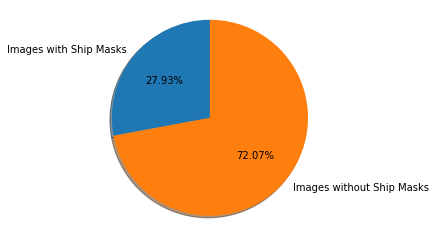

In [8]:
labels = 'Images with Ship Masks','Images without Ship Masks'
sizes = [image_masks[masks_with_images].ImageId.nunique(),(~masks_with_images).sum()]
explode = (0, 0)
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.2f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle. '%1.1f%%'

plt.show()

In [9]:
pixels_df = image_masks[masks_with_images]
pixels_df['pixel_counts'] = pixels_df['EncodedPixels'].str.split(' ')
pixels_df['pixel_counts_intermediate']= [row[1::2] for row in pixels_df['pixel_counts']]
pixels_df['pixel_counts_per_image']= [sum(map(int, row)) for row in pixels_df['pixel_counts_intermediate']]
Total_Ship_Pixels = pixels_df['pixel_counts_per_image'].sum()
print ('Ship pixels:', Total_Ship_Pixels )
print ('Total pixels across images with ships:', (image_masks[masks_with_images].ImageId.nunique() * 768 * 768))
print ('Total pixels across training data:', (image_masks.ImageId.nunique() * 768 * 768))

print(round((Total_Ship_Pixels/(image_masks[masks_with_images].ImageId.nunique() * 768 * 768) ) * 100,1),'Percent of Pixels Represent Ships in Images with Ships ')
print(round((Total_Ship_Pixels/(image_masks.ImageId.nunique() * 768 * 768) ) * 100,1),'Percent of Pixels Represent Ships Across All Training Images ')

C:\Users\anant\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\anant\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Ship pixels: 87714996
Total pixels across images with ships: 17146183680
Total pixels across training data: 61382983680
0.5 Percent of Pixels Represent Ships in Images with Ships 
0.1 Percent of Pixels Represent Ships Across All Training Images 


C:\Users\anant\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


Text(0.5,1,'Decoded Mask')

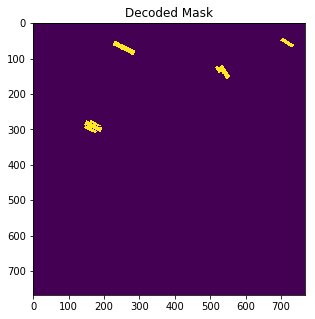

In [10]:
fig, (axis1) = plt.subplots(1, figsize = (16, 5))
run_len_encoded_image = image_masks.query('ImageId=="00113a75c.jpg"')['EncodedPixels']
segmented_image = convert_masks_to_image(run_len_encoded_image)

axis1.imshow(segmented_image)
axis1.set_title('Decoded Mask')

Text(0,0.5,'Images')

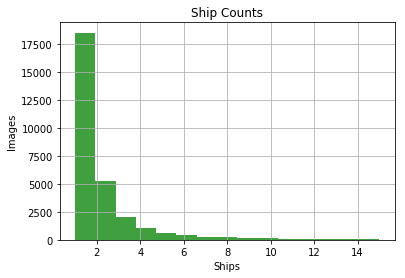

In [11]:
hist=ship_counts_unique.hist(column='counts',bins = 15,orientation = 'vertical', facecolor= 'green', alpha= 0.75)
plt.title('Ship Counts')
plt.xlabel("Ships")
plt.ylabel("Images")

In [11]:
no_ship_image_generator = make_image_generator(image_masks[~masks_with_images],batch_size = 4)
no_ship_rgb_images, no_ship_segment_mask_images = next(no_ship_image_generator)

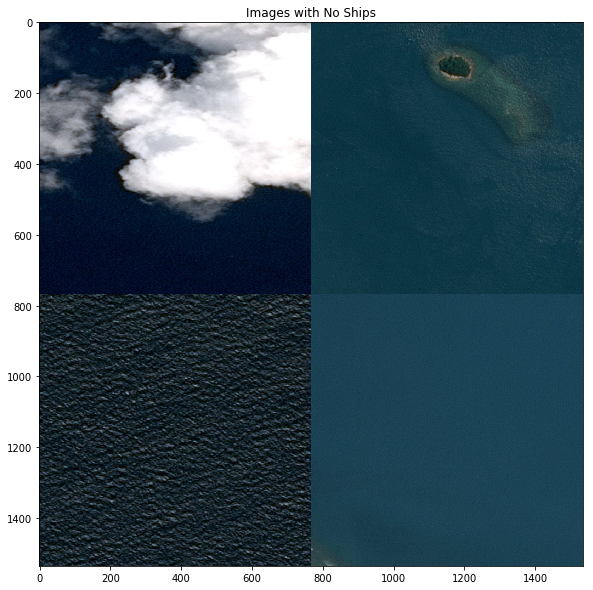

In [12]:
fig, (ax1) = plt.subplots(1, figsize = (30, 10))
montage_no_ships_rgb = montage_images(no_ship_rgb_images)
ax1.imshow(montage_no_ships_rgb)
ax1.set_title('Images with No Ships')
fig.savefig('Images with No Ships.png')

In [15]:
images_with_seven_plus_ships = ship_counts.loc[ship_counts['counts'] >= 7]

In [16]:
ship_image_generator = make_image_generator(images_with_seven_plus_ships,batch_size = 4)
ship_rgb_images, ship_segment_mask_images = next(ship_image_generator)


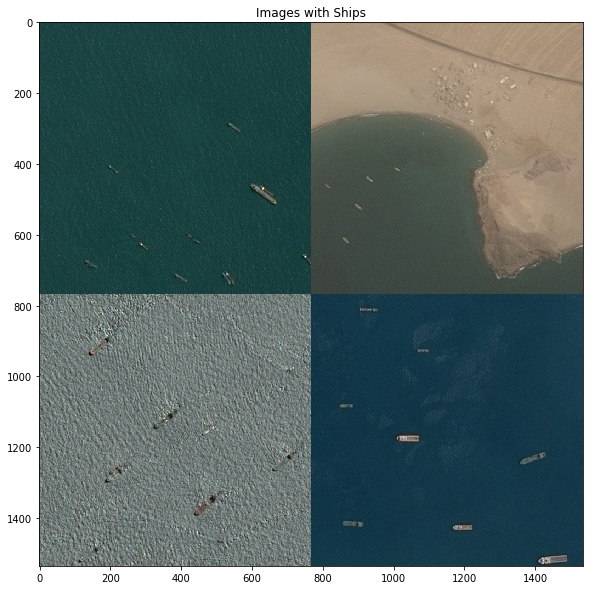

In [17]:
fig, (ax1) = plt.subplots(1, figsize = (30, 10))
montage_with_ships_rgb = montage_images(ship_rgb_images)
ax1.imshow(montage_with_ships_rgb)
ax1.set_title('Images with Ships')
fig.savefig('Images with Ships.png')

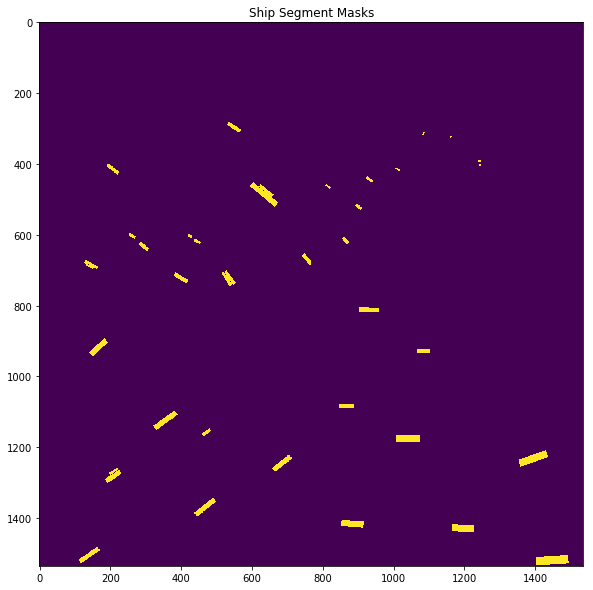

In [18]:
fig, (ax1) = plt.subplots(1, figsize = (30, 10))
montage_with_ship_segment_masks = montage(ship_segment_mask_images[:, :, :, 0])
ax1.imshow(montage_with_ship_segment_masks)
ax1.set_title('Ship Segment Masks')
fig.savefig('Images with Ship segments.png')

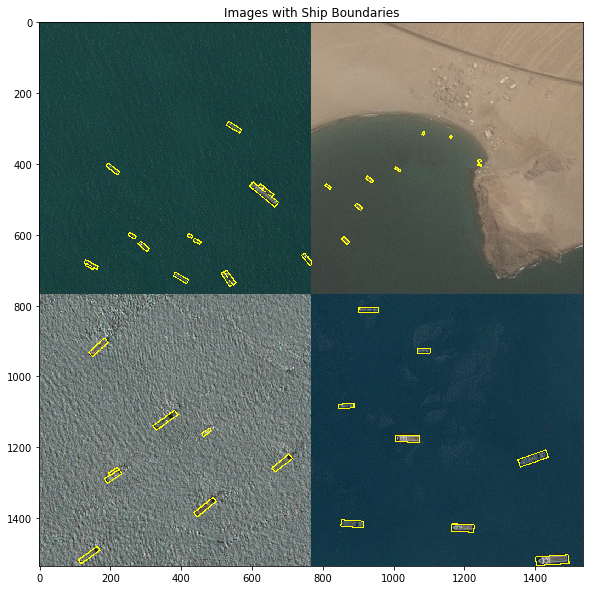

In [19]:
fig, (ax1) = plt.subplots(1, figsize = (30, 10))
montage_with_ships_boundaries = mark_boundaries(montage_with_ships_rgb, 
                             montage_with_ship_segment_masks.astype(int),color=(1,1,0),outline_color=(1,1,0))
ax1.imshow(montage_with_ships_boundaries)
ax1.set_title('Images with Ship Boundaries')
fig.savefig('Images with Ship Boundaries.png')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


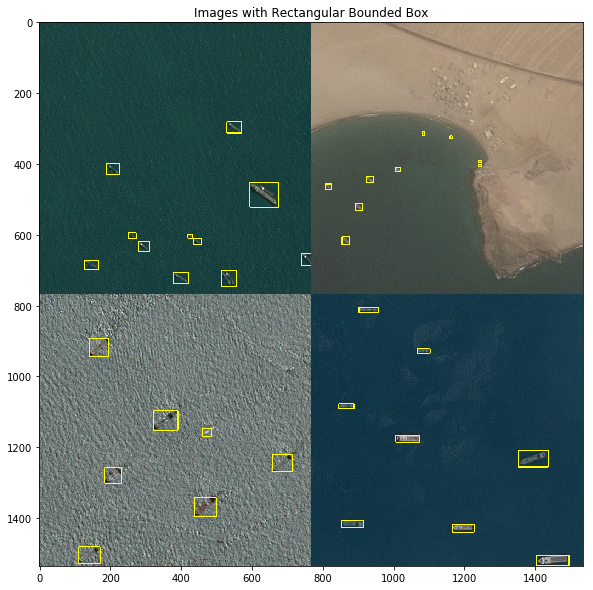

In [20]:
rgb_image_bounded_box = []
for i in range(ship_rgb_images.shape[0]):
    rgb_image = ship_rgb_images[i,:,:,:]
    segmented_image = ship_segment_mask_images[i, :, :, 0]
    #print(image_0_rgb.shape)
    #print(type(image_0_rgb))
    lbl_masks = label(segmented_image) 
    region_props = regionprops(lbl_masks)
    
    for props in region_props:
            cv2.rectangle(rgb_image, (props.bbox[1], props.bbox[0]), (props.bbox[3], props.bbox[2]), (255, 255, 0), 2)
    rgb_image_bounded_box.append (rgb_image)

#print(ship_rgb_images.shape[0])

fig, (ax1) = plt.subplots(1, figsize = (30, 10))
montage_with_rectangular_bounded_box = montage_images(np.array(rgb_image_bounded_box))
ax1.imshow(montage_with_rectangular_bounded_box)
ax1.set_title('Images with Rectangular Bounded Box')
fig.savefig('Rectangular Bounded Box.png')

Image 000155de5.jpg
Box placed at the pixel (465, 344, 501, 448)


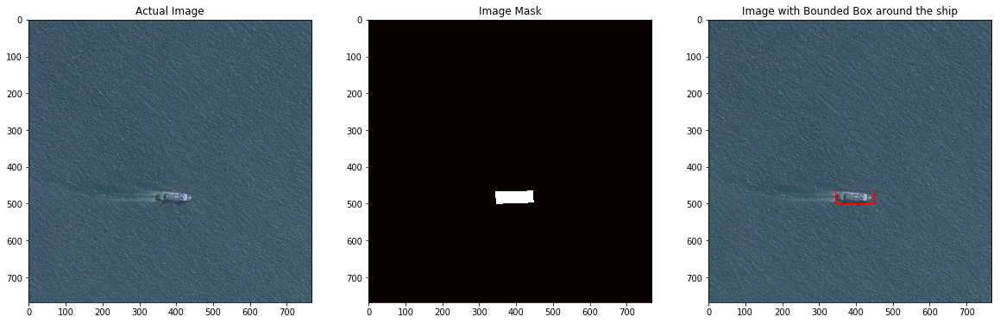

Image 00021ddc3.jpg
Box placed at the pixel (705, 96, 720, 121)
Box placed at the pixel (732, 123, 768, 178)
Box placed at the pixel (629, 181, 638, 187)
Box placed at the pixel (661, 195, 665, 201)


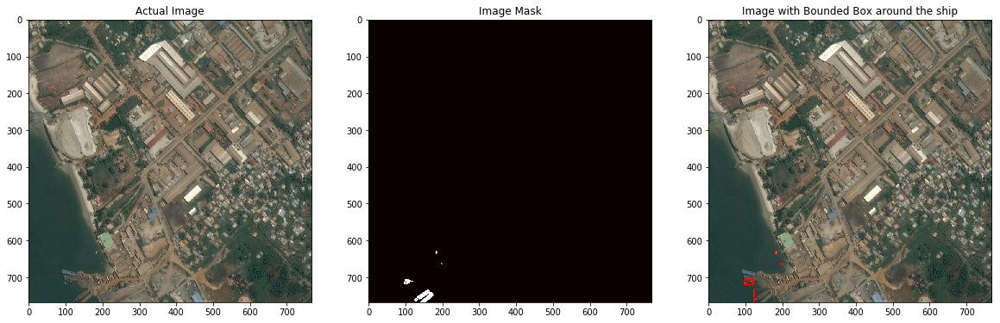

Image 0002756f7.jpg
Box placed at the pixel (36, 324, 67, 351)


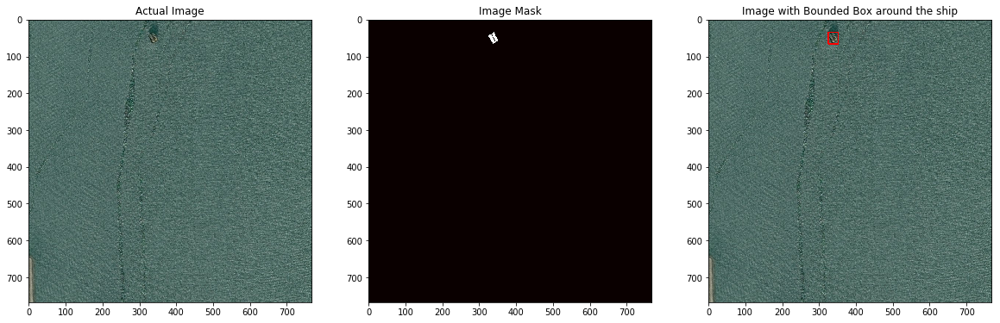

Image 00031f145.jpg
Box placed at the pixel (124, 443, 153, 472)


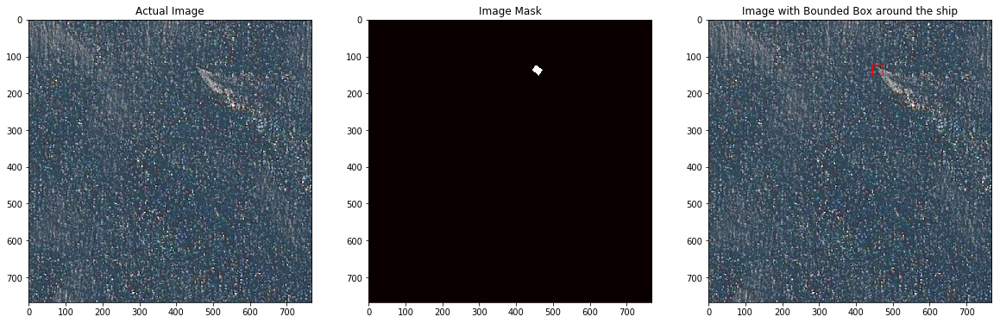

Image 00053c6ba.jpg
Box placed at the pixel (124, 736, 139, 752)


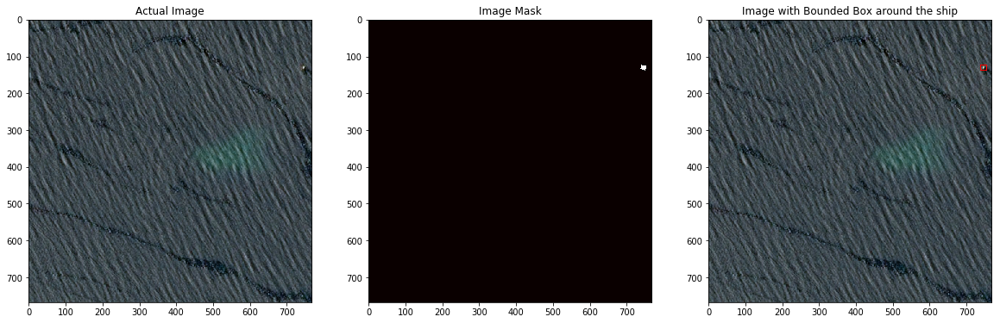

Image 0005d01c8.jpg
Box placed at the pixel (598, 72, 739, 237)
Box placed at the pixel (252, 476, 321, 556)


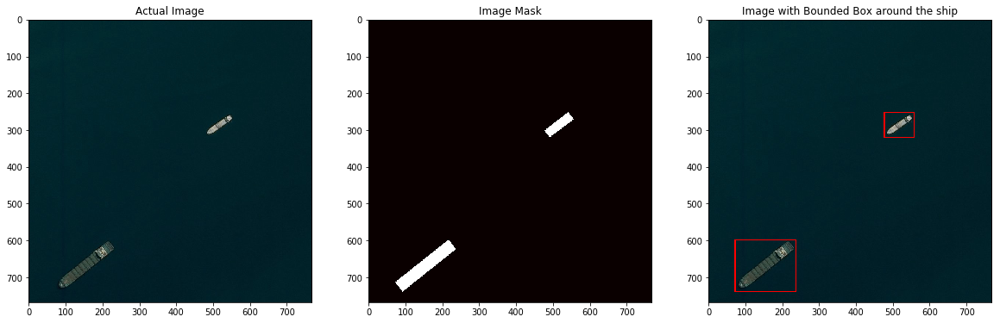

Image 0006c52e8.jpg
Box placed at the pixel (197, 190, 472, 407)


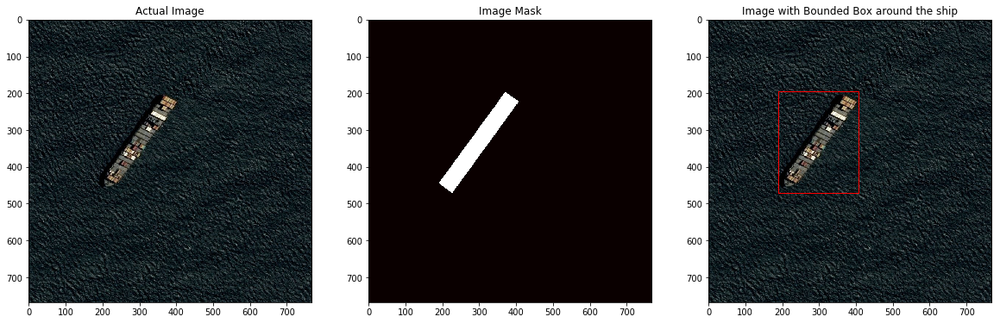

Image 000d42241.jpg
Box placed at the pixel (583, 480, 588, 488)


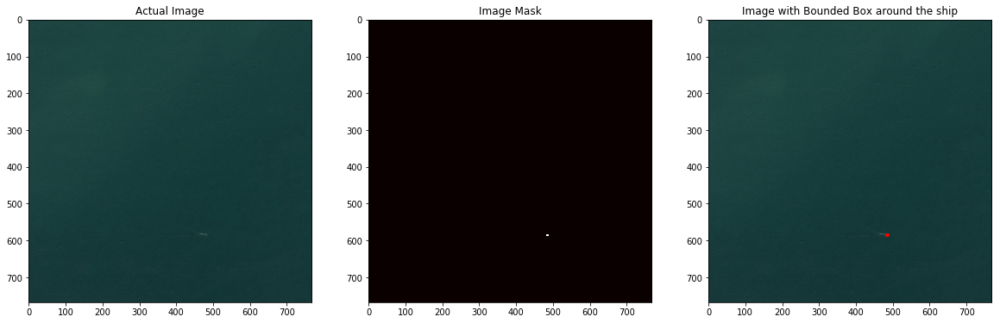

Image 000e6378b.jpg
Box placed at the pixel (401, 292, 422, 325)


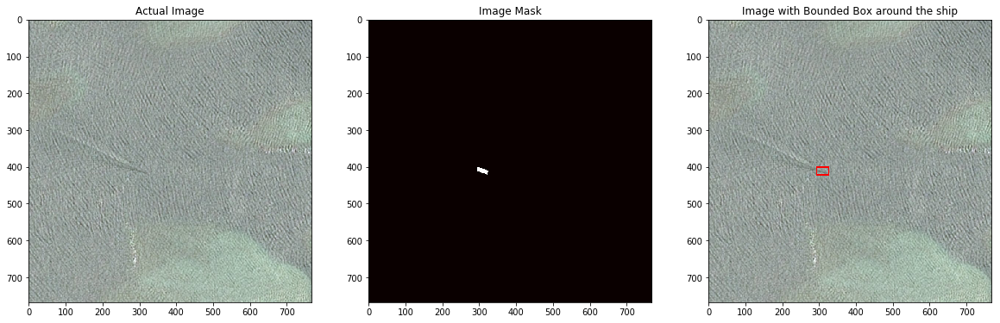

Image 000fd9827.jpg
Box placed at the pixel (259, 69, 276, 85)


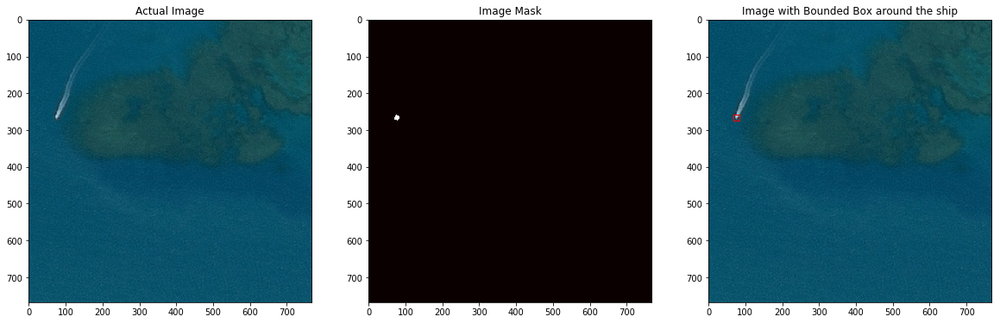

In [21]:
#Images with ship masks (In this data frame we will get duplicate image_ids)
images_with_ship_masks = image_masks.dropna()

#Fetching unique images with ships from the above dataframe
unique_images_with_ships = images_with_ship_masks["ImageId"].unique()

#Display a round box against ships for images
for i in range(10):
    #Get the image id
    image_id = unique_images_with_ships[i]
    
    #Create 3 subplots to show the actual image, mask of the image and the ship with the rounded box around it
    img, (plt1, plt2, plt3) = plt.subplots(1, 3, figsize = (20, 10))
    
    #Get the path of the image 
    rgb_path = os.path.join(train_image_dir, image_id)
    
    #Read the image path
    actual_img = imread(rgb_path)
    
    #Query the pixel value of the image
    pixelValue = image_masks.query('ImageId=="'+image_id+'"')['EncodedPixels']
  
    #Query the details of the image
    #image_details = image_masks.query('ImageId=="'+image+'"')
    
    #Take the individual ship masks and create a single mask array for all ships
    img_mask = np.expand_dims(convert_masks_to_image(pixelValue), -1)
    
    #Label the image with -1 wherever object pixel is found
    lbl = label(img_mask) 
    
    #Measure the properties of labeled image
    Region_props = regionprops(lbl)
    img_with_roundedBox = actual_img.copy()
    print ('Image', image_id)
    
    #Place the box around the founded region of the object
    for r in Region_props:
        print('Box placed at the pixel', r.bbox)
        cv2.rectangle(img_with_roundedBox, (r.bbox[1], r.bbox[0]), (r.bbox[3], r.bbox[2]), (255, 0, 0), 2)

    #Set the title of the images
    plt1.set_title('Actual Image')
    plt2.set_title('Image Mask')
    plt3.set_title('Image with Bounded Box around the ship')
    
    plt1.imshow(actual_img) #Show the actual image
    plt2.imshow(img_mask[...,0], cmap='hot')#Show the mask of the image
    plt3.imshow(img_with_roundedBox)#Show the image with rounded box around ship
    
    plt.show()#Show the entire figure


C:\Users\anant\Anaconda3\lib\site-packages\skimage\exposure\exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warn("This might be a color image. The histogram will be "


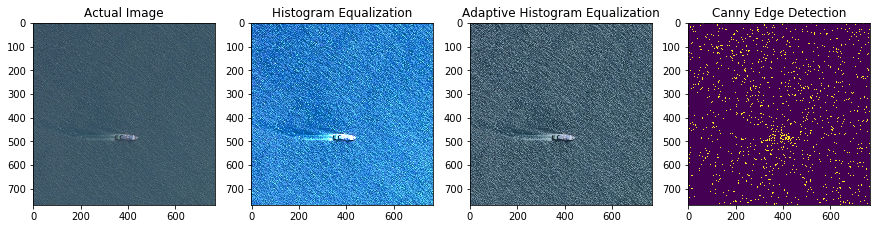

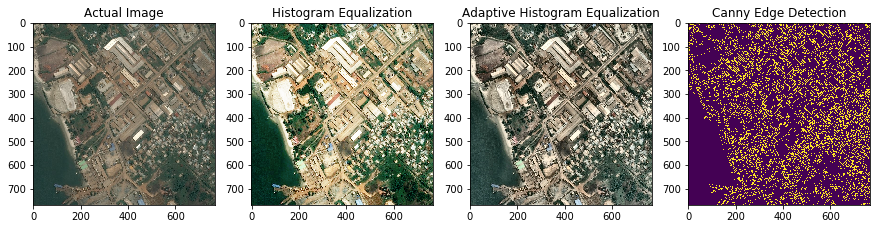

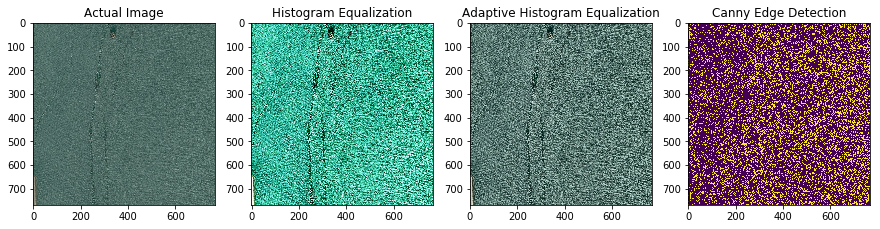

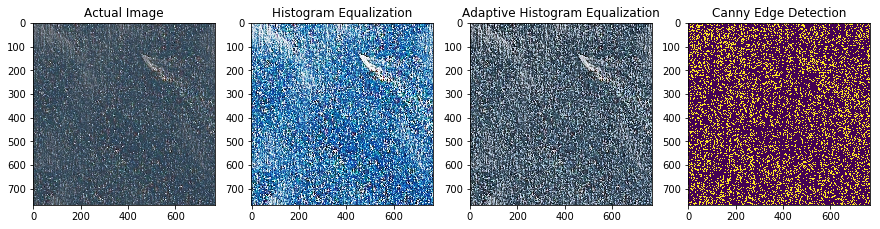

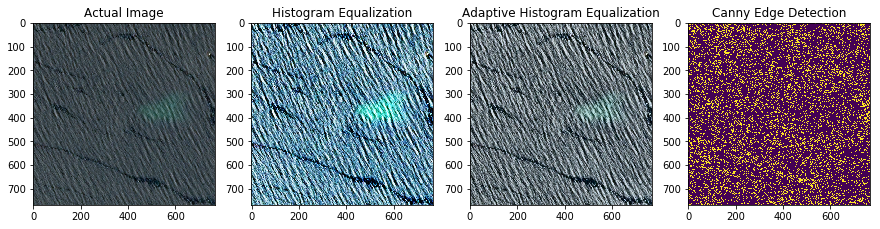

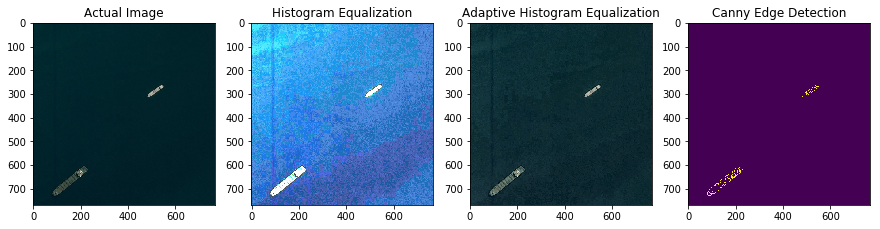

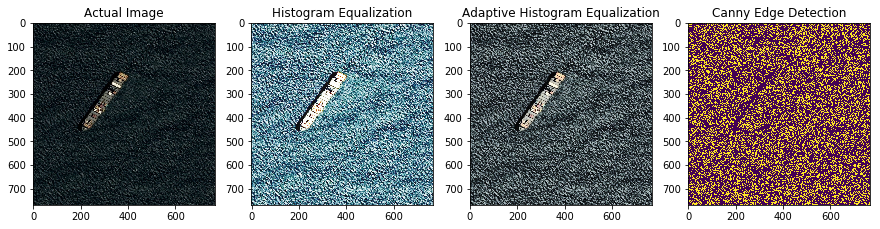

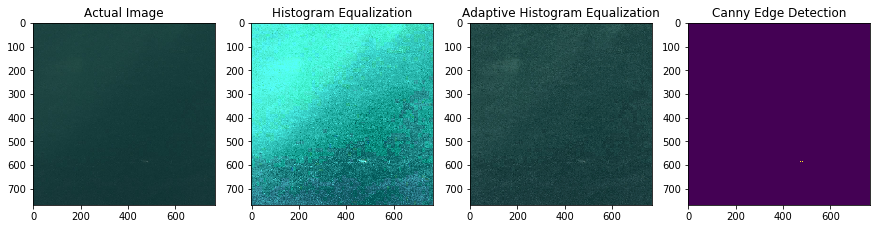

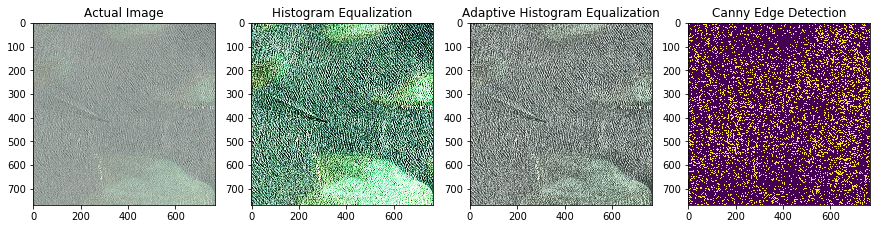

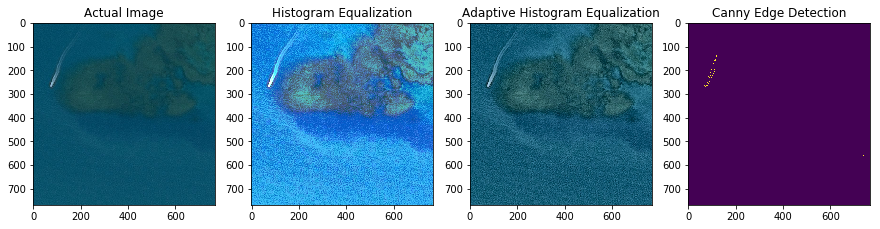

In [23]:
#Display contrast images
for i in range(10):
    #Get the image id
    image_id = unique_images_with_ships[i]
    
    #Create 4 subplots to show the actual image, and the contrast image
    img, (plt1, plt2,plt3,plt4) = plt.subplots(1, 4, figsize = (15, 10))
    
    #Get the path of the image 
    rgb_path = os.path.join(train_image_dir, image_id)
    
    #Read the image path
    actual_img = imread(rgb_path)
    
    #Convert image to lab color model
    lab_image = cv2.cvtColor(actual_img, cv2.COLOR_BGR2LAB)
   
    #Split the lab image to different color channels
    l, a, b = cv2.split(lab_image)
  
    #Applying CLAHE((Contrast Limited Adaptive Histogram Equalization) to L-channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    
    #Merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl,a,b))

    #Converting image from LAB Color model to RGB model
    adaptive_eq_image = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
 
    #Histogram equlization
    img_equalizehist = exposure.equalize_hist(actual_img)
    
    edged_img = cv2.Canny(actual_img, 100, 100)
    
    #Set the title of the images
    plt1.set_title('Actual Image')
    plt2.set_title('Histogram Equalization')
    plt3.set_title('Adaptive Histogram Equalization')
    plt4.set_title('Canny Edge Detection')
    
    plt1.imshow(actual_img) #Show the actual image
    plt2.imshow(img_equalizehist)
    plt3.imshow(adaptive_eq_image)
    plt4.imshow(edged_img)
 
    plt.show()#Show the entire figure


8531 initial training images selected
600 initial validation images selected


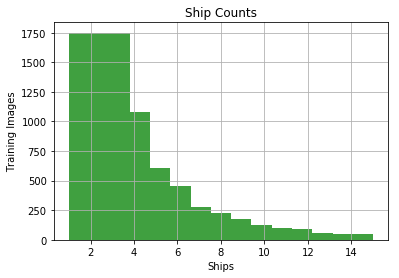

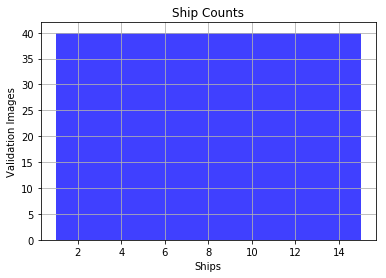

In [20]:
initial_training_df = ship_counts_unique.groupby('counts').apply(lambda rows_grouped_by_count: rows_grouped_by_count.sample(1750,random_state=0) if len(rows_grouped_by_count) > 1750 else rows_grouped_by_count)
hist=initial_training_df.hist(column='counts',bins = 15,orientation = 'vertical', facecolor= 'green', alpha= 0.75)
plt.title('Ship Counts')
plt.xlabel("Ships")
plt.ylabel("Training Images")
print(initial_training_df.shape[0], 'initial training images selected')

initial_validation_df = ship_counts_unique.groupby('counts').apply(lambda rows_grouped_by_count: rows_grouped_by_count.sample(40,random_state=50) if len(rows_grouped_by_count) > 40 else rows_grouped_by_count)
hist=initial_validation_df.hist(column='counts',bins = 15,orientation = 'vertical', facecolor= 'blue', alpha= 0.75)
plt.title('Ship Counts')
plt.xlabel("Ships")
plt.ylabel("Validation Images")
print(initial_validation_df.shape[0], 'initial validation images selected')

In [25]:
#Create image generator for "Initial_Training_DF" dataframe created above
initial_training_gen = make_image_generator(initial_training_df,50)
initial_training_rgb_images, initial_training_segment_mask_images = next(initial_training_gen)
print('Training Images', initial_training_rgb_images.shape, initial_training_rgb_images.dtype, initial_training_rgb_images.min(), initial_training_rgb_images.max())
print('Training Image Segment masks', initial_training_segment_mask_images.shape, initial_training_segment_mask_images.dtype, initial_training_segment_mask_images.min(), initial_training_segment_mask_images.max())

initial_validation_gen = make_image_generator(initial_validation_df,initial_validation_df.shape[0])
initial_validation_rgb_images, initial_validation_segment_mask_images = next(initial_validation_gen)
print('Validation Images', initial_validation_rgb_images.shape, initial_validation_rgb_images.dtype, initial_validation_rgb_images.min(), initial_validation_rgb_images.max())
print('Validation Image Segment masks', initial_validation_segment_mask_images.shape, initial_validation_segment_mask_images.dtype, initial_validation_segment_mask_images.min(), initial_validation_segment_mask_images.max())

Training Images (50, 768, 768, 3) float64 0.0 1.0
Training Image Segment masks (50, 768, 768, 1) uint8 0 1
Validation Images (600, 768, 768, 3) float64 0.0 1.0
Validation Image Segment masks (600, 768, 768, 1) uint8 0 1


In [26]:
'''Keras provides the ImageDataGenerator class for image augmentation which includes
   Feature-wise standardization, Random rotation, shifts, shear and flips, Dimension reordering.
'''
#define image data preparation
image_data_gen = ImageDataGenerator(featurewise_center=False, shear_range = 0.01,height_shift_range = 0.1,width_shift_range = 0.1,samplewise_center = False,data_format = 'channels_last',fill_mode = 'reflect', horizontal_flip = True, vertical_flip = True, zoom_range = [0.9, 1.25],rotation_range = 45)

def image_augmentation(initial_training_gen):
    np.random.seed(np.random.choice(range(9999)))
    for in_xbatch, in_ybatch in initial_training_gen:
        seed = np.random.choice(range(9999))
        
        #Takes data & label arrays, generates batches of augmented data.
        x_arryOfimages = image_data_gen.flow(255*in_xbatch, batch_size = in_xbatch.shape[0], seed = seed, shuffle=True)
        y_arrayOflabels = image_data_gen.flow(in_ybatch, batch_size =in_xbatch.shape[0], seed = seed, shuffle=True) #Masks
        
        yield next(x_arryOfimages)/255.0, next(y_arrayOflabels)

In [27]:
augmented_images = image_augmentation(initial_training_gen)
augmented_images_for_model, augmented_masks_for_model = next(augmented_images)
print('x', augmented_images_for_model.shape, augmented_images_for_model.dtype, augmented_images_for_model.min(), augmented_images_for_model.max())
print('y', augmented_masks_for_model.shape, augmented_masks_for_model.dtype, augmented_masks_for_model.min(), augmented_masks_for_model.max())

x (50, 768, 768, 3) float32 0.0 1.0
y (50, 768, 768, 1) float32 0.0 1.0


In [28]:
#Generate augmented images for one particular image 
from keras.preprocessing.image import ImageDataGenerator,img_to_array, load_img
img = load_img('C:\Mason\last sem\DAEN 690\project\data\dummy\\0005d01c8.jpg')  
x = img_to_array(img)  # creating a Numpy array with shape (3, 150, 150)
x = x.reshape((1,) + x.shape)  # converting to a Numpy array with shape (1, 3, 150, 150)

In [26]:
#save augmented images in a folder
i = 0
for batch in image_data_gen.flow(x,save_to_dir='C:\Mason\last sem\DAEN 690\project\data\dummy\preview', save_prefix='ship', save_format='jpeg'):
    i += 1
    if i > 36:
        break

In [27]:
# Build CNN Model
input_image = layers.Input(augmented_images_for_model.shape[1:], name = 'RGB_Input')
input_layer0 = input_image
#random data augmentation to prevent overfitting.
input_layer0 = layers.GaussianNoise(0.1)(input_layer0)
#normalize activations from previous layer to between 0 and 1 so all layers interpret activations similarly
input_layer0 = layers.BatchNormalization()(input_layer0)
#input_image = layers.Input((768, 768, 3))

c1 = Conv2D(8, (3, 3), activation='relu', padding='same') (input_layer0)
c1 = Conv2D(8, (3, 3), activation='relu', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(16, (3, 3), activation='relu', padding='same') (p1)
c2 = Conv2D(16, (3, 3), activation='relu', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(32, (3, 3), activation='relu', padding='same') (p2)
c3 = Conv2D(32, (3, 3), activation='relu', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(64, (3, 3), activation='relu', padding='same') (p3)
c4 = Conv2D(64, (3, 3), activation='relu', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(128, (3, 3), activation='relu', padding='same') (p4)
c5 = Conv2D(128, (3, 3), activation='relu', padding='same') (c5)

u6 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(64, (3, 3), activation='relu', padding='same') (u6)
c6 = Conv2D(64, (3, 3), activation='relu', padding='same') (c6)

u7 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(32, (3, 3), activation='relu', padding='same') (u7)
c7 = Conv2D(32, (3, 3), activation='relu', padding='same') (c7)

u8 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(16, (3, 3), activation='relu', padding='same') (u8)
c8 = Conv2D(16, (3, 3), activation='relu', padding='same') (c8)

u9 = Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = layers.concatenate([u9, c1], axis=3)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (u9)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c9)

output = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[input_image], outputs=[output])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
RGB_Input (InputLayer)          (None, 768, 768, 3)  0                                            
__________________________________________________________________________________________________
gaussian_noise_1 (GaussianNoise (None, 768, 768, 3)  0           RGB_Input[0][0]                  
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 768, 768, 3)  12          gaussian_noise_1[0][0]           
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 768, 768, 8)  224         batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [28]:
## Defining Loss function - intersection over union
def IoU(y_true, y_pred, tresh=1e-6):
    if np.max(y_true) == 0.0:
        return IoU(1-y_true, 1-y_pred)
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3]) - intersection
    return -K.mean( (intersection + tresh) / (union + tresh), axis=0)

In [29]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
#weight_path="{}_weights.best.hdf5".format('model')
best_model="DAEN690_best_weights_5steps_36epochs.hdf5"

checkpoint = ModelCheckpoint(best_model, monitor='val_loss', verbose=1, save_best_only=True, mode='min', save_weights_only=True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=1, verbose=1, mode='min',
                                   min_delta=0.0001, cooldown=0, min_lr=1e-8)

early = EarlyStopping(monitor="val_loss", mode="min", verbose=2,
                      patience=5) 

callbacks_list = [checkpoint, early, reduceLROnPlat]

In [35]:
model.compile(optimizer=Adam(1e-3, decay=1e-6), loss=IoU, metrics=['binary_accuracy'])
#model.compile(optimizer="adam", loss="binary_crossentropy", metrics=['binary_accuracy'])
augmented_images = image_augmentation(make_image_generator(initial_training_df,batch_size = 50))
model_result = model.fit_generator(augmented_images, steps_per_epoch = 7, epochs = 24, 
                                   validation_data = (initial_validation_rgb_images, initial_validation_segment_mask_images),
                                   callbacks = callbacks_list,
                                   workers = 2)

Epoch 1/24
7/7 [==============================] - 1727s 247s/step - loss: -0.0028 - binary_accuracy: 0.7478 - val_loss: -0.0016 - val_binary_accuracy: 0.6669

Epoch 00001: val_loss improved from inf to -0.00155, saving model to DAEN690_best_weights.hdf5
Epoch 2/24
7/7 [==============================] - 1886s 269s/step - loss: -0.0030 - binary_accuracy: 0.6907 - val_loss: -0.0018 - val_binary_accuracy: 0.6482

Epoch 00002: val_loss improved from -0.00155 to -0.00177, saving model to DAEN690_best_weights.hdf5
Epoch 3/24
7/7 [==============================] - 1676s 239s/step - loss: -0.0039 - binary_accuracy: 0.6797 - val_loss: -0.0028 - val_binary_accuracy: 0.6354

Epoch 00003: val_loss improved from -0.00177 to -0.00280, saving model to DAEN690_best_weights.hdf5
Epoch 4/24
7/7 [==============================] - 1743s 249s/step - loss: -0.0065 - binary_accuracy: 0.6413 - val_loss: -0.0178 - val_binary_accuracy: 0.6267

Epoch 00004: val_loss improved from -0.00280 to -0.01776, saving mode

In [52]:
print(model_result.epoch)
print([model_result.history['loss']])
print([model_result.history['val_loss']])
print([model_result.history['binary_accuracy']])
print([model_result.history['val_binary_accuracy']])

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
[[-0.002837569752175893, -0.0029931546055844854, -0.0038640149536409546, -0.00646188053568559, -0.059695644570248466, -0.0754332308258329, -0.07938569784164429, -0.09614629830632891, -0.09035608864256314, -0.10170584384884153, -0.09366150572896004, -0.12673061234610422, -0.09816199966839381, -0.09136692168457168, -0.10878978776080268, -0.09261650858180863]]
[[-0.0015549709108502914, -0.0017747261056986947, -0.0027989220009961477, -0.017764039027194183, -0.04592917983730634, -0.05224956106394529, -0.05371654142315189, -0.05439620573694507, -0.05471312797938784, -0.055121167562901974, -0.05658631927023331, -0.053991722563902535, -0.05397710918138424, -0.053962422690043844, -0.05402838159352541, -0.054091191540161766]]
[[0.7477714078766959, 0.6906747732843671, 0.679682697568621, 0.6412884507860456, 0.6099318010466439, 0.609215761934008, 0.6184373072215489, 0.6495098045894078, 0.6747025506837028, 0.6857778004237584, 0.6703088198389325,

In [30]:
epochs = model_result.epoch
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10))
    
_ = ax1.plot(epochs, model_result.history['loss'], 'b-', epochs, model_result.history['val_loss'], 'r-')
ax1.legend(['Training', 'Validation'])
ax1.set_title('Loss')
    
_ = ax2.plot(epochs, model_result.history['binary_accuracy'], 'b-',
             epochs, model_result.history['val_binary_accuracy'], 'r-')
ax2.legend(['Training', 'Validation'])
ax2.set_title('Binary Accuracy (%)')

NameError: name 'model_result' is not defined

In [38]:
model.save_weights('DAEN690_model_weights.hdf5')
model.save('DAEN690_model.h5') # creates a HDF5 file 'my_model.h5'
model.load_weights(best_model)

In [54]:
import gc; gc.enable()
gc.collect()

111871

In [35]:
model.compile(optimizer=Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=1e-6), loss=IoU, metrics=['binary_accuracy'])
augmented_images = image_augmentation(make_image_generator(initial_training_df,batch_size = 100))
model_result = model.fit_generator(augmented_images, steps_per_epoch = 3, epochs = 36, 
                                   validation_data = (initial_validation_rgb_images, initial_validation_segment_mask_images),
                                   callbacks = callbacks_list,
                                   workers = 1)
model.save_weights('DAEN690_model_weights_5steps_36epochs.hdf5')
model.save('DAEN690_model_5steps_36epochs.h5') # 
model.load_weights(best_model)

Epoch 1/36
3/3 [==============================] - 2653s 884s/step - loss: -0.0030 - binary_accuracy: 0.2923 - val_loss: -0.0022 - val_binary_accuracy: 0.5334

Epoch 00001: val_loss did not improve from -0.00224
Epoch 2/36
3/3 [==============================] - 2389s 796s/step - loss: -0.0034 - binary_accuracy: 0.3323 - val_loss: -0.0022 - val_binary_accuracy: 0.5309

Epoch 00002: val_loss did not improve from -0.00224

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
Epoch 3/36
3/3 [==============================] - 3061s 1020s/step - loss: -0.0034 - binary_accuracy: 0.4259 - val_loss: -0.0023 - val_binary_accuracy: 0.5235

Epoch 00003: val_loss improved from -0.00224 to -0.00226, saving model to DAEN690_best_weights_5steps_36epochs.hdf5

Epoch 00003: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 4/36
3/3 [==============================] - 3019s 1006s/step - loss: -0.0035 - binary_accuracy: 0.4079 - val_loss: -0.0023 - val_bin

In [37]:
import gc; gc.enable()
gc.collect()

214925

In [12]:
ship_dir = 'C:\Mason\last sem\DAEN 690\project\data'
train_image_dir = os.path.join(ship_dir, 'train')
test_image_dir = os.path.join(ship_dir, 'test')
new_test_image_dir = os.path.join(ship_dir, 'newtest')

image_masks = pd.read_csv(os.path.join('C:\Mason\last sem\DAEN 690\project\data', 'train_ship_segmentations_v2.csv'))
fullres_model = models.load_model('C:\Mason\last sem\DAEN 690\project\data\DAEN690_model_Best.h5', compile=False)
seg_in_shape = fullres_model.get_input_shape_at(0)[1:3]
seg_out_shape = fullres_model.get_output_shape_at(0)[1:3]
print(seg_in_shape, '->', seg_out_shape)

(None, None) -> (None, None)


In [13]:
new_test_image_dir = os.listdir(new_test_image_dir)
#test_paths = os.listdir(new_test_image_dir)
print(len(new_test_image_dir), 'test images found')

11 test images found


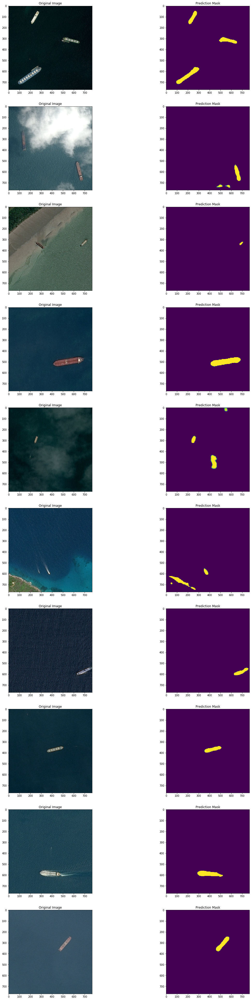

In [14]:
#Generate prediction masks
fig, m_axs = plt.subplots(10, 2, figsize = (20, 70))
for (ax1, ax2), c_img_name in zip(m_axs, new_test_image_dir):
    c_path = os.path.join(test_image_dir, c_img_name)
    c_img = imread(c_path)
    
    first_img = np.expand_dims(c_img, 0)/255.0
    lbl = label(first_img[0]) 
    Region_props = regionprops(lbl)

    img_with_roundedBox = c_img.copy()
    
    first_seg = fullres_model.predict(first_img)
                
   
   
    ax1.imshow(first_img[0])
    ax1.set_title('Original Image')
    ax2.imshow(first_seg[0, :, :, 0], vmin = 0, vmax = 1)
    ax2.set_title('Prediction Mask')
fig.savefig('test_predictions.png')

Predicted image: Box placed at the pixel (568, 96, 716, 300)
Predicted image: Box placed at the pixel (48, 204, 164, 284)
Predicted image: Box placed at the pixel (292, 492, 344, 648)
Original Image: Box placed at the pixel (548, 77, 731, 313)
Original Image: Box placed at the pixel (483, 192, 496, 200)
Original Image: Box placed at the pixel (44, 200, 171, 288)
Original Image: Box placed at the pixel (285, 485, 351, 659)
Predicted image: Box placed at the pixel (728, 572, 740, 584)
Predicted image: Box placed at the pixel (544, 632, 680, 684)
Original Image: Box placed at the pixel (222, 120, 409, 165)
Original Image: Box placed at the pixel (508, 615, 685, 690)
Predicted image: Box placed at the pixel (324, 680, 348, 704)
Original Image: Box placed at the pixel (292, 655, 368, 737)
Predicted image: Box placed at the pixel (460, 412, 540, 684)
Original Image: Box placed at the pixel (445, 402, 550, 695)
Predicted image: Box placed at the pixel (268, 236, 324, 272)
Original Image: Box 

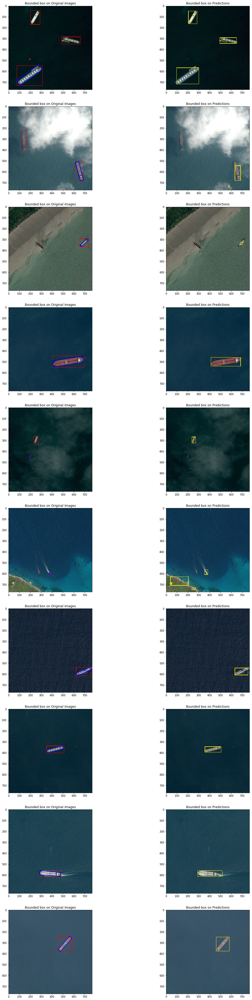

In [29]:
#Make predictions
fig, m_axs = plt.subplots(10, 2, figsize = (20, 70))
from skimage.morphology import binary_opening, disk
for (ax1, ax2), c_img_name in zip(m_axs, new_test_image_dir):
    c_path = os.path.join(test_image_dir, c_img_name)
    c_img = imread(c_path)
      
    first_img = np.expand_dims(c_img, 0)/255.0
  
    img_with_roundedBox = c_img.copy()
    
    #Make the prediction
    first_seg = fullres_model.predict(first_img)
    
    labels = label(first_seg[0,:, :, 0])
    
  
    #Generate label mask out of predicted image
    lbl_masks = label(first_seg[0])
    region_props = regionprops(lbl_masks)
    
    
    for props in region_props:
        print('Predicted image: Box placed at the pixel', props.bbox)
        cv2.rectangle(img_with_roundedBox, (props.bbox[1], props.bbox[0]), (props.bbox[3], props.bbox[2]), (255, 255, 0), 2)
   
    #Query the pixel value of the original image
    pixelValue = image_masks.query('ImageId=="'+c_img_name+'"')['EncodedPixels']
  
    #Take the individual ship masks and create a single mask array for all ships
    img_mask = np.expand_dims(convert_masks_to_image(pixelValue), -1)
    
    #Label the image with -1 wherever object pixel is found
    lbl_origImage = label(img_mask) 
    
    #Measure the properties of labeled image for original image
    Region_props_origImage = regionprops(lbl_origImage)
    img_with_roundedBox_origImage = c_img.copy()

    #Place the box around the founded region of the object
    for r in Region_props_origImage:
        print('Original Image: Box placed at the pixel', r.bbox)
        cv2.rectangle(img_with_roundedBox_origImage, (r.bbox[1], r.bbox[0]), (r.bbox[3], r.bbox[2]), (255, 0, 0), 2)

        
    _,contours,_ = cv2.findContours(img_mask.copy(), 1, 1)
    rect = cv2.minAreaRect(contours[0])
    (x,y),(w,h), a = rect # a - angle

    box = cv2.boxPoints(rect)
    box = np.int0(box) #turn into ints
    rect2 = cv2.drawContours(img_with_roundedBox_origImage,[box],0,(0,0,255),3)

    ax1.imshow(img_with_roundedBox_origImage)
    ax1.set_title('Bounded box on Original Images')
    ax2.imshow(img_with_roundedBox)
    ax2.set_title('Bounded box on Predictions')
 
fig.savefig('test_predictions.png')